## Import Libraries

Because we need a particular opencv version for CMAKE

In [ ]:
!pip uninstall opencv-contrib-python
!pip uninstall open-cv

Uninstalling opencv-contrib-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.6/dist-packages/cv2/*
    /usr/local/lib/python3.6/dist-packages/opencv_contrib_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-contrib-python-4.1.2.30


In [ ]:
!pip install opencv-contrib-python==3.4.2.17
!pip install --upgrade imutils

     |████████████████████████████████| 30.6MB 133kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30
Requirement already up-to-date: imutils in /usr/local/lib/python3.6/dist-packages (0.5.3)


**Important Libraries**

In [ ]:
import cv2
import numpy as np
import imutils
import matplotlib.pyplot as plt
from random import randrange
from google.colab.patches import cv2_imshow
import sys
import time
import os
import tqdm
from moviepy.editor import ImageSequenceClip

# For 24->8bit
from PIL import Image

%matplotlib inline

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)1482752/45929032 bytes (3.2%)4210688/45929032 bytes (9.2%)8019968/45929032 bytes (17.5%)12017664/45929032 bytes (26.2%)16080896/45929032 bytes (35.0%)19988480/45929032 bytes (43.5%)23969792/45929032 bytes (52.2%)27942912/45929032 bytes (60.8%)31899648/45929032 bytes (69.5%)35864576/45929032 bytes (78.1%)39903232/45929032 bytes (86.9%)43900928/45929032 bytes (95.6%)4

#### Extracting frames


**Importing Data**

In [ ]:
cam_front = cv2.VideoCapture("/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Front.mp4")
cam_left = cv2.VideoCapture("/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Left.mp4")
cam_right = cv2.VideoCapture("/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Right.mp4")

!!!***NEED TO RUN THESE ONLY ONCE FOR GENERATING THE DATASET FROM VIDEOS***!!!

1. Front Camera

In [ ]:
# frame 
currentframe = 0

# Calculating the total frames  
'''
Make sure to enter the time in seconds
'''
time_in_seconds = 20
fps = 30
max_frames = time_in_seconds*fps

while(currentframe < (max_frames+1)): 
      
    # reading from frame 
    ret,frame = cam_front.read() 
  
    if ret: 
        # if video is still left continue creating images 
        name = '/content/drive/Shared drives/drive 4/Carla Dataset/Images/Front/' + str(currentframe) + '.png'
        print('Creating......', name)
        # writing the extracted images 
        cv2.imwrite(name, frame) 
  
        # increasing counter so that it will 
        # show how many frames are created 
        currentframe += 1

    else: 
        break
  
# Release all space and windows once done 
cam_front.release() 
cv2.destroyAllWindows() 

2.  Left Camera

In [ ]:
# frame 
currentframe = 0
  
while(currentframe < (max_frames+1)): 
      
    # reading from frame 
    ret,frame = cam_left.read() 
  
    if ret: 
        # if video is still left continue creating images 
        name = '/content/drive/Shared drives/drive 4/Carla Dataset/Images/Left/' + str(currentframe) + '.png'
        print('Creating......', name)
        # writing the extracted images 
        cv2.imwrite(name, frame) 
  
        # increasing counter so that it will 
        # show how many frames are created 
        currentframe += 1

    else: 
        break
  
# Release all space and windows once done 
cam_left.release() 
cv2.destroyAllWindows() 

3. Right Camera

In [ ]:
# frame 
currentframe = 0
  
while(currentframe < (max_frames+1)): 
      
    # reading from frame 
    ret,frame = cam_right.read() 
  
    if ret: 
        # if video is still left continue creating images 
        name = '/content/drive/Shared drives/drive 4/Carla Dataset/Images/Right/' + str(currentframe) + '.png'
        print('Creating......', name)
        # writing the extracted images 
        cv2.imwrite(name, frame) 
  
        # increasing counter so that it will 
        # show how many frames are created 
        currentframe += 1

    else: 
        break
  
# Release all space and windows once done 
cam_right.release() 
cv2.destroyAllWindows() 

## Stitching Images

In [ ]:
frame = 90
img1 = cv2.imread(f'/content/drive/Shareddrives/drive 4/Carla Dataset/Images/Left/{frame}.png')
# img1 = cv2.imread('/content/Left.png')
img1 = img1.astype('uint8')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread(f'/content/drive/Shareddrives/drive 4/Carla Dataset/Images/Front/{frame}.png')
# img2 = cv2.imread('/content/Front.png')
img2 = img2.astype('uint8')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img3 = cv2.imread(f'/content/drive/Shareddrives/drive 4/Carla Dataset/Images/Right/{frame}.png')
# img3 = cv2.imread('/content/Right.png')
img3 = img3.astype('uint8')
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

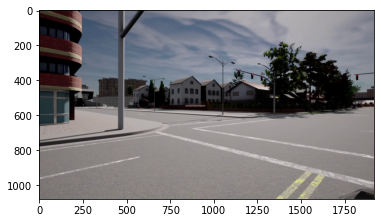

In [ ]:
# Checking the images
plt.imshow(img1)

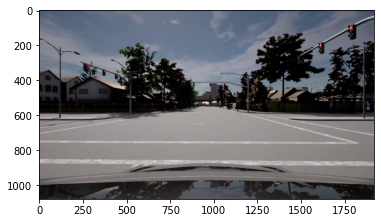

In [ ]:
# Checking the left
plt.imshow(img2)

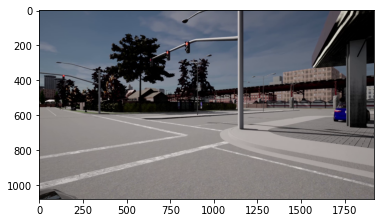

In [ ]:
# Checking the right
plt.imshow(img3)

### 1. Making a simple Panorama

Using inbuilt libraries

In [ ]:
# Defining the stitcher
stitcher = cv2.createStitcher(try_use_gpu=True)

In [ ]:
# Stitching the images
images = [img1, img2, img3]

(status, stitched) = stitcher.stitch(images)

Panorama Generated


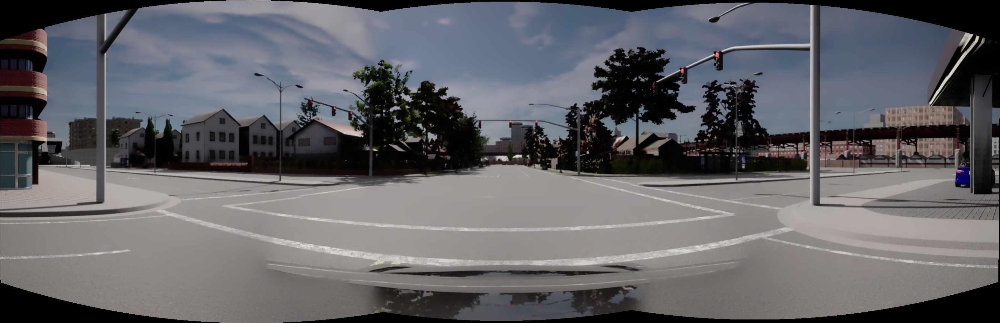

In [ ]:
if (status==cv2.STITCHER_OK):
  print('Panorama Generated')

  stitched = cv2.cvtColor(stitched, cv2.COLOR_BGR2RGB)
  cv2_imshow(stitched)

else:
  print('Error Generating Panorama')

#### Cropping the Panaroma to a rectangular area

Cropping...


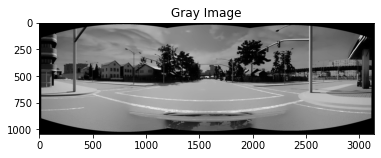

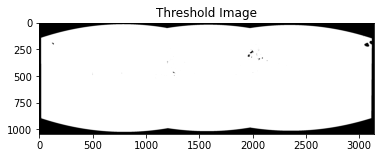

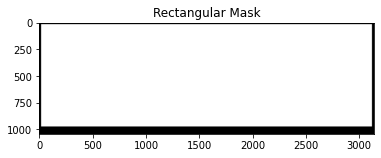

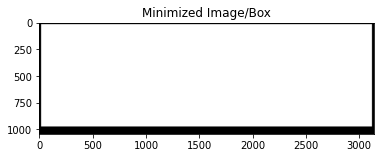

20 20 3101 953


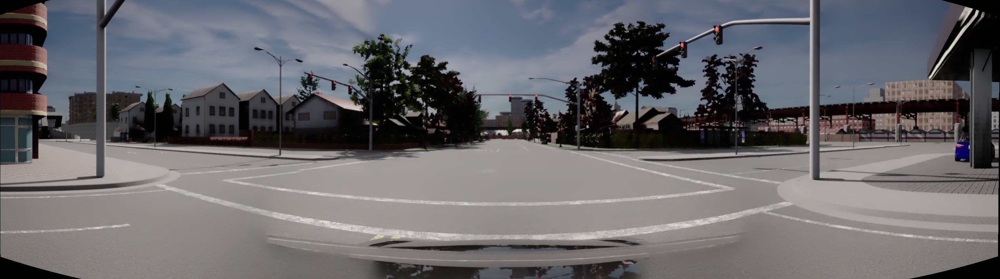

In [ ]:
if status == cv2.STITCHER_OK:
  # create a 10 pixel border surrounding the stitched image
  print("Cropping...")
  stitched = cv2.copyMakeBorder(stitched, 10, 10, 10, 10,
    cv2.BORDER_CONSTANT, (0, 0, 0))

  # convert the stitched image to grayscale and threshold it
  # such that all pixels greater than zero are set to 255
  # (foreground) while all others remain 0 (background)
  gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

  # To get the intermediate results
  plt.imshow(gray, cmap='gray')
  plt.title("Gray Image")
  plt.show()

  plt.pause(0.2)

  plt.imshow(thresh, cmap='gray')
  plt.title("Threshold Image")
  plt.show()

  plt.pause(0.2)

  # find all external contours in the threshold image then find
  # the *largest* contour which will be the contour/outline of
  # the stitched image
  cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  c = max(cnts, key=cv2.contourArea)

  # allocate memory for the mask which will contain the
  # rectangular bounding box of the stitched image region
  mask = np.zeros(thresh.shape, dtype="uint8")
  (x, y, w, h) = cv2.boundingRect(c)

  h = int(0.95*h)

  cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)

  plt.imshow(cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1), cmap='gray')
  plt.title("Rectangular Mask")
  plt.show()

  plt.pause(0.2)

  # create two copies of the mask: one to serve as our actual
  # minimum rectangular region and another to serve as a counter
  # for how many pixels need to be removed to form the minimum
  # rectangular region
  minRect = mask.copy()
  sub = mask.copy()

  # # keep looping until there are no non-zero pixels left in the
  # # subtracted image
  # while cv2.countNonZero(sub) > 2500:
  #   # erode the minimum rectangular mask and then subtract
  #   # the thresholded image from the minimum rectangular mask
  #   # so we can count if there are any non-zero pixels left
  #   minRect = cv2.erode(minRect, None)
  #   sub = cv2.subtract(minRect, thresh)

  plt.imshow(minRect, cmap='gray')
  plt.title('Minimized Image/Box')
  plt.show()

  plt.pause(0.2)

  # find contours in the minimum rectangular mask and then
  # extract the bounding box (x, y)-coordinates
  cnts = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  c = max(cnts, key=cv2.contourArea)
  (x, y, w, h) = cv2.boundingRect(c)

  print(x, y, w, h)
  # use the bounding box coordinates to extract the our final
  # stitched image
  stitched_cropped = stitched[100: 60 + 906, x:x + w]

# Display the output stitched image to our screen
cv2_imshow(stitched_cropped)

In [ ]:
stitched_cropped.shape

(866, 3101, 3)

In [ ]:
stitched_cropped_resized = cv2.resize(stitched_cropped, (1920, 720))

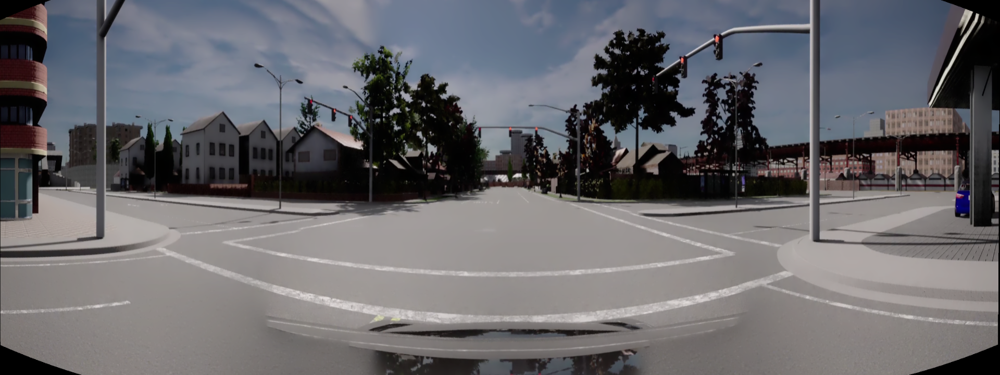

In [ ]:
cv2_imshow(stitched_cropped_resized)

### Extracting the keypoints

Importing the images

#### Datapoints Code

To display the keypoints in an image

**Reference -**
https://www.youtube.com/watch?v=ToldvnUtBh0

**More Info -**
https://docs.opencv.org/3.4/d4/d5d/group__features2d__draw.html

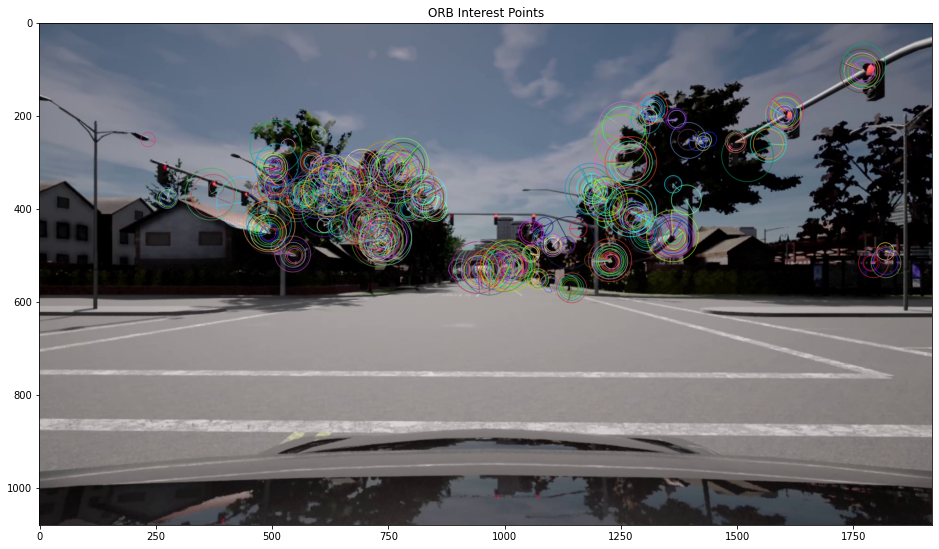

In [ ]:
'''
Basic format for drawing the keypoints on an image 
void cv::drawKeypoints	(	InputArray 	image, 
                          const std::vector< KeyPoint > & 	keypoints,
                          InputOutputArray 	outImage, 
                          const Scalar & color = Scalar::all(-1), 
                          DrawMatchesFlags 	flags = DrawMatchesFlags::DEFAULT )		

Python:
outImage	=	cv.drawKeypoints(	image, keypoints, outImage[, color[, flags]]	)
'''

dataset_path = '/content/drive/My Drive/Colab Notebooks/Carla Dataset/Images/'
img_building = cv2.imread(os.path.join(dataset_path, f'Front/{frame}.png'))

# Convert from cv's BRG default color order to RGB
img_building = cv2.cvtColor(img_building, cv2.COLOR_BGR2RGB)

# OpenCV 3 backward incompatibility: Do not create a detector with `cv2.ORB()`
orb = cv2.ORB_create()  

# To detect the keypoints
key_points, description = orb.detectAndCompute(img_building, None)

# To plot/draw the keypoints
img_building_keypoints = cv2.drawKeypoints(img_building, 
                                           key_points, 
                                           img_building, 
                                           flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw circles.

plt.figure(figsize=(16, 16))
plt.title('ORB Interest Points')
plt.imshow(img_building_keypoints); 
plt.show()

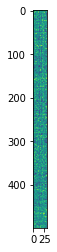

In [ ]:
# Checking what the "description" variable returns
plt.imshow(description)

##### Method 1 (Estimating the common points)

**What is BFMatcher?**

Brute-force descriptor matcher

For each descriptor in the first set, this matcher finds the closest descriptor in the second set by trying each one. This descriptor matcher supports masking permissible matches of descriptor sets.

**More Info -** https://docs.opencv.org/3.4/d3/da1/classcv_1_1BFMatcher.html#details


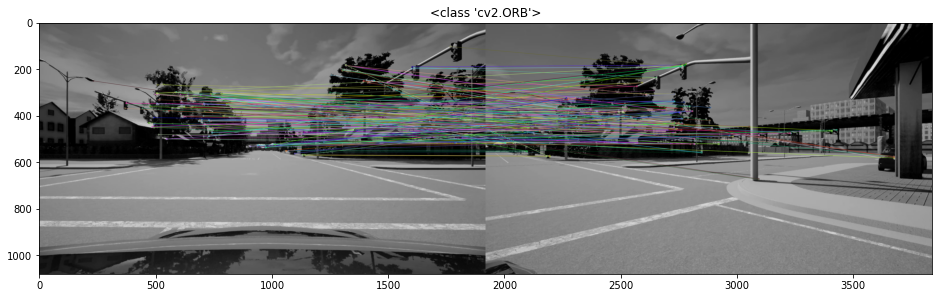

In [ ]:
def image_detect_and_compute(detector, img_name):
    """Detect and compute interest points and their descriptors."""
    img = cv2.imread(os.path.join(dataset_path, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(img, None)
    return img, kp, des
    
def draw_image_matches(detector, img1_name, img2_name, nmatches=10):
    """Draw ORB feature matches of the given two images"""
    img1, kp1, des1 = image_detect_and_compute(detector, img1_name)
    img2, kp2, des2 = image_detect_and_compute(detector, img2_name)
    
    # To find the common points in the two images
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    
    '''The next few lines are for predicting the matches'''
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance) # Sort matches by distance. Best comes first.
    
    # To draw lines stretching across the span of the two images from the center of one
    # Common point to another
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nmatches], img2, flags=2) #Show top 10 matches (Default)
    plt.figure(figsize=(16, 16))
    plt.title(type(detector))
    plt.imshow(img_matches); plt.show()
    
number_of_matches_to_plot = 250
orb = cv2.ORB_create()
draw_image_matches(orb, f'Front/{frame}.png', f'Right/{frame}.png', number_of_matches_to_plot)

Another method to plot the keypoints

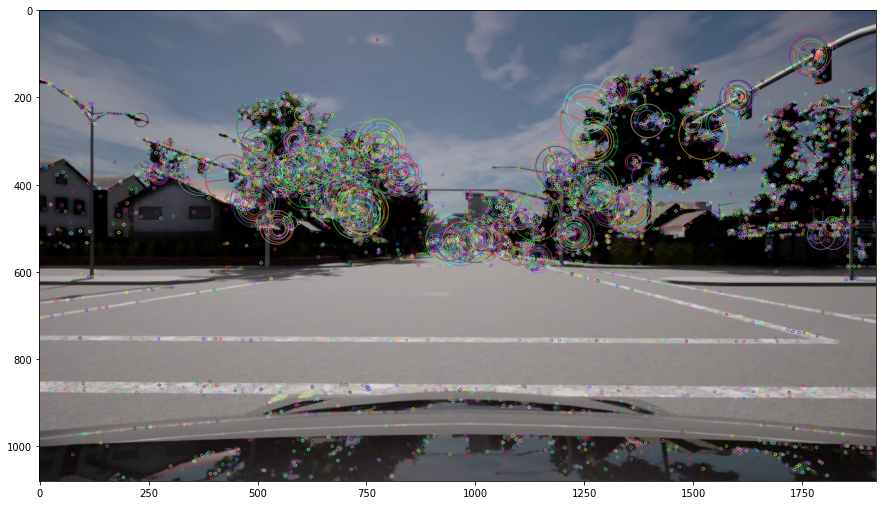

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()

kp, des = sift.detectAndCompute(img_building, None)
img_kp = cv2.drawKeypoints(img_building, kp, img_building)

plt.figure(figsize=(15, 15))
plt.imshow(img_kp); plt.show()

##### Method 2 (Estimating the common points)


**What is a KD-Tree** 

A kd-tree is a data structure used to quickly solve nearest-neighbor queries.

**More info -** https://www.vlfeat.org/overview/kdtree.html

**FLANN -** https://pypi.org/project/flann/

Fast Library for Approximate Nearest Neighbors

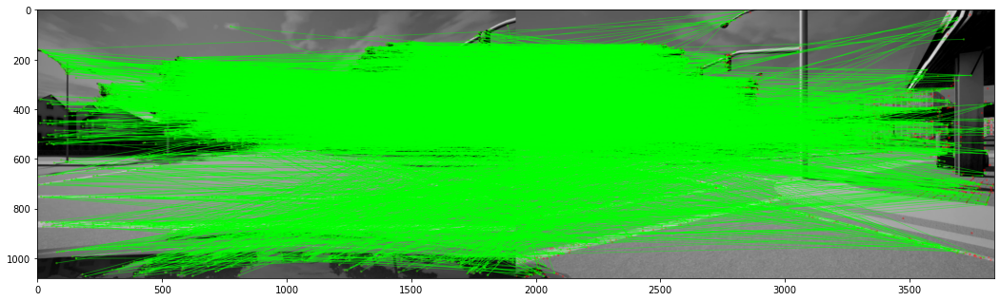

In [ ]:
img_1, kp1, des1 = image_detect_and_compute(sift, f'Front/{frame}.png')
img_2, kp2, des2 = image_detect_and_compute(sift, f'Right/{frame}.png')

# Applying KDTree to solve for Nearest Neighbors
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1, des2, k=2)

matchesMask = [[0, 0] for i in range(len(matches))]

# Ratio test as per Lowe's paper
'''
The lower the value of 'alpha' the fewer lines will be displayed
This value controls the distance at which the lines will be plotted for the common points in the two images
'''
alpha = 1
for i, (m, n) in enumerate(matches):
    if m.distance < alpha*n.distance:
        matchesMask[i] = [1, 0]

draw_params = dict( matchColor=(0, 255, 0),
                    singlePointColor=(255, 0, 0),
                    matchesMask=matchesMask,
                    flags=0 )

img_key = cv2.drawMatchesKnn(img_1, kp1, img_2, kp2, matches, None, **draw_params)
plt.figure(figsize=(18, 18))
plt.imshow(img_key); plt.show()

#### Cylindrical Warping

In [ ]:
def cylindricalWarp(img, K):
    """This function returns the cylindrical warp for a given image and intrinsics matrix K"""
    h_,w_ = img.shape[:2]
    # pixel coordinates
    y_i, x_i = np.indices((h_,w_))
    X = np.stack([x_i,y_i,np.ones_like(x_i)],axis=-1).reshape(h_*w_,3) # to homog
    Kinv = np.linalg.inv(K) 
    X = Kinv.dot(X.T).T # normalized coords

    # calculate cylindrical coords (sin\theta, h, cos\theta)
    A = np.stack([np.sin(X[:,0]),X[:,1],np.cos(X[:,0])],axis=-1).reshape(w_*h_,3)
    B = K.dot(A.T).T # project back to image-pixels plane
    
    # back from homog coords
    B = B[:,:-1] / B[:,[-1]]
    
    # make sure warp coords only within image bounds
    B[(B[:,0] < 0) | (B[:,0] >= w_) | (B[:,1] < 0) | (B[:,1] >= h_)] = -1
    B = B.reshape(h_,w_,-1)
    
    # for transparent borders...
    img_rgba = cv2.cvtColor(img,cv2.COLOR_BGR2BGRA) 
    
    # warp the image according to cylindrical coords
    return cv2.remap(img_rgba, B[:,:,0].astype(np.float32), B[:,:,1].astype(np.float32), cv2.INTER_AREA, borderMode=cv2.BORDER_WRAP)

**Preprocessing**

In [ ]:
h, w = img.shape[:2]
K = np.array([[800,0,w/2],[0,800,h/2],[0,0,1]]) # mock intrinsics

In [ ]:
# Applying the warping

img_cyl1 = cylindricalWarp(img1, K)
img_cyl2 = cylindricalWarp(img2, K)
# img_cyl2 = img2.copy()
img_cyl3 = cylindricalWarp(img3, K)

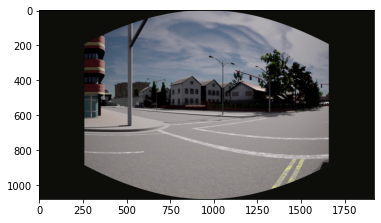

In [ ]:
plt.imshow(img_cyl1)

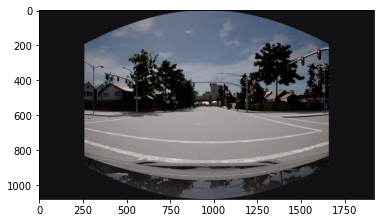

In [ ]:
plt.imshow(img_cyl2)

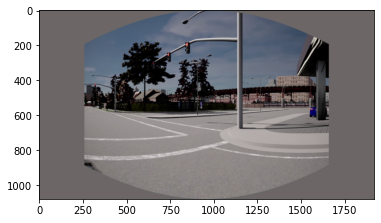

In [ ]:
plt.imshow(img_cyl3)

### Trial

Importing the images


#### 1. Trial Code

1. Getting the data points

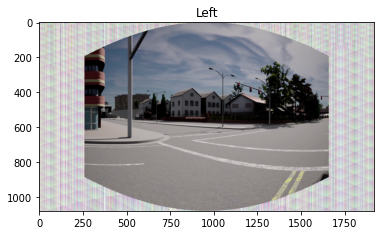

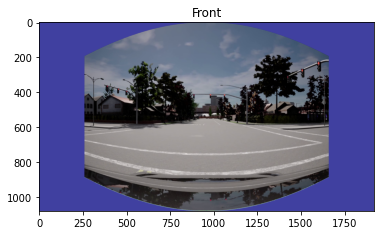

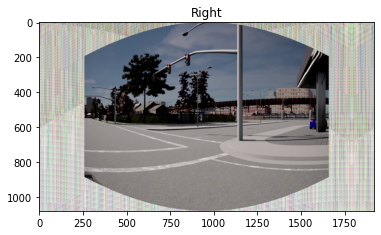

In [ ]:
# To check the images
plt.imshow(img_cyl1, cmap='gray')
plt.title('Left')
plt.show()

plt.pause(0.2)
plt.imshow(img_cyl2, cmap='gray')
plt.title('Front')
plt.show()

plt.pause(0.2)
plt.imshow(img_cyl3, cmap='gray')
plt.title('Right')
plt.show()

In [ ]:
# Converting the images to B&W

img1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
img3 = cv2.cvtColor(img3, cv2.COLOR_RGB2GRAY)

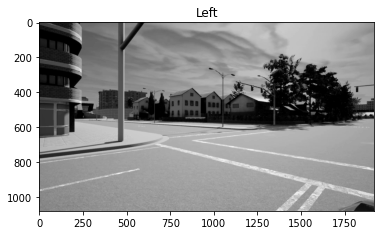

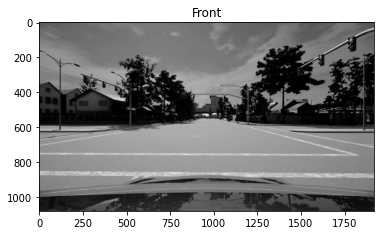

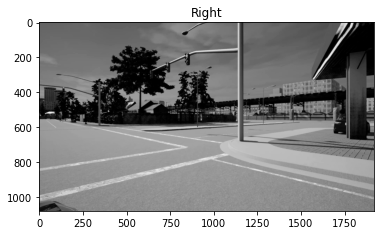

In [ ]:
# To check the images
plt.imshow(img1, cmap='gray')
plt.title('Left')
plt.show()

plt.pause(0.2)
plt.imshow(img2, cmap='gray')
plt.title('Front')
plt.show()

plt.pause(0.2)
plt.imshow(img3, cmap='gray')
plt.title('Right')
plt.show()

In [ ]:
# Defining SIFT
sift = cv2.xfeatures2d.SIFT_create()

In [ ]:
# Find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img2,None)
kp2, des2 = sift.detectAndCompute(img3,None)

In [ ]:
# Getting the common points
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

In [ ]:
# Apply ratio test

good = []
alpha = 0.85
for m, n in matches:
    if m.distance < alpha*n.distance:
        good.append(m)

matches = np.asarray(good)

In [ ]:
# Checking the output
# draw_params = dict( matchColor=(0, 255, 0),
#                     singlePointColor=(255, 0, 0),
#                     matchesMask=matchesMask,
#                     flags=0 )

# img_key = cv2.drawMatchesKnn(img2, kp1, img3, kp2, matches, None, **draw_params)
# plt.figure(figsize=(18, 18))
# plt.imshow(img_key); plt.show()

#### Homography

A Homography is a transformation ( a 3×3 matrix ) that maps the points in one image to the corresponding points in the other image.

**More Info -** https://www.learnopencv.com/homography-examples-using-opencv-python-c/

In [ ]:
matches.shape

(1063,)

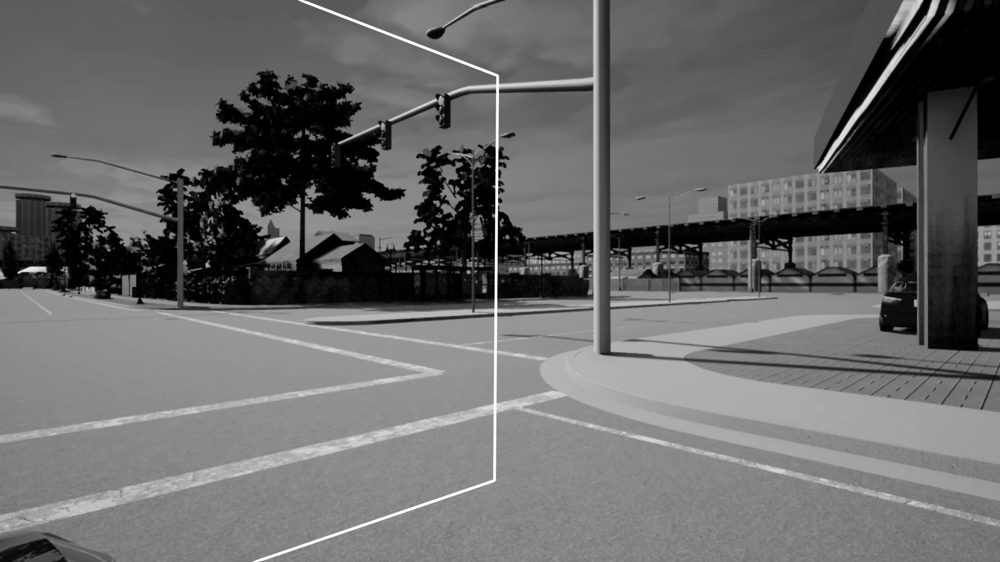

In [ ]:
# There should be a minimum of 10 matches to include
MIN_MATCH_COUNT = 10

# Homography
if len(matches) >= MIN_MATCH_COUNT:
  src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
  dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

  # Applying Homography
  H, masked = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

  '''
  OPTIONAL TO RUN, JUST FOR CHECKING THE OUTPUT OF THE FILES
  '''
  # Getting the dimensions of the image (To be used soon)
  h, w = img2.shape

  pts = np.float32([ [0,0], [0, h-1], [w-1, h-1], [w-1,0 ] ]).reshape(-1,1,2)
  img__ = cv2.perspectiveTransform(pts, H)

  '''
  To plot a line to display the stitch boundary
  '''
  img_ = cv2.polylines(img3, [np.int32(img__)], True, 255, 3, cv2.LINE_AA)
  
  '''
  To print the overlapping image
  '''
  # To reduce the file size
  # plt.imshow(img3, cmap='gray')
  cv2_imshow(img_)
  
# Throw an error if there aren't enough keypoints
else:
  raise AssertionError(f'Can’t find enough keypoints - {len(matches)/MIN_MATCH_COUNT}')

In [ ]:
print(H)

[[ 2.87014865e+01  8.75746967e-01 -2.81653700e+04]
 [ 7.88580685e+00  2.13172035e+01 -1.10257374e+04]
 [ 1.41532807e-02  1.09595112e-03  1.00000000e+00]]


In [ ]:
print(np.ndarray.flatten(H))

[ 2.87014865e+01  8.75746967e-01 -2.81653700e+04  7.88580685e+00
  2.13172035e+01 -1.10257374e+04  1.41532807e-02  1.09595112e-03
  1.00000000e+00]


#### Trim Function (Optional)]

In [ ]:
# To crop the black part of the stitched image

def trim(frame):
  # Cropping the top
  if not np.sum(frame[0]):
    return trim(frame[1:])

  if not np.sum(frame[-1]):
    return trim(frame[:-2])

  if not np.sum(frame[:, 0]):
    return trim(frame[:, 1:])

  if not np.sum(frame[:, -1]):
    return trim(frame[:, :-2])

  return frame

In [ ]:
# Resultant Image
cv2_imshow(trim(img_cyl1))

##### Whole Code (Applied)

In [ ]:
# img2 = cv2.imread('/content/Screenshot 2020-11-03 112809.png')
# img3 = cv2.imread('/content/Screenshot 2020-11-03 112821.png')

img = cv2.cvtColor(img_1,cv2.COLOR_BGR2GRAY)

imgm = cv2.cvtColor(img_2,cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(imgm,None)
kp2, des2 = sift.detectAndCompute(img,None)

bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m in matches:
    if m[0].distance < 0.55*m[1].distance:
        good.append(m)
matches = np.asarray(good)

if len(matches[:,0]) >= 10:
    src = np.float32([ kp1[m.queryIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
    dst = np.float32([ kp2[m.trainIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
    H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
    
    '''
    Optional
    '''
    # Getting the dimensions of the image (To be used soon)
    # h, w = img.shape

    # pts = np.float32([ [0,0], [0, h-1], [w-1, h-1], [w-1,0 ] ]).reshape(-1,1,2)
    # img__ = cv2.perspectiveTransform(pts, H)

    '''
    To plot a line to display the stitch boundary
    '''
    # img_ = cv2.polylines(imgm, [np.int32(img__)], True, 255, 3, cv2.LINE_AA)
    
    '''
    To print the overlapping image
    '''
    # To reduce the file size
    # plt.imshow(imgm, cmap='gray')
    # cv2_imshow(img_)

else:
    raise AssertionError("Cannot find enough keypoints.")

In [ ]:
# Homography Matrix
print(H)

[[ 8.41751026e-01 -1.43413543e-02  4.51703317e+02]
 [-4.68596722e-02  9.72687405e-01  1.56337863e+01]
 [-2.27535185e-04  2.11647123e-06  1.00000000e+00]]


In [ ]:
stitched = cv2.warpPerspective(imgm, H, (img.shape[1] + imgm.shape[1], img.shape[0]))
stitched[0:img.shape[0], 0:img.shape[1]] = img

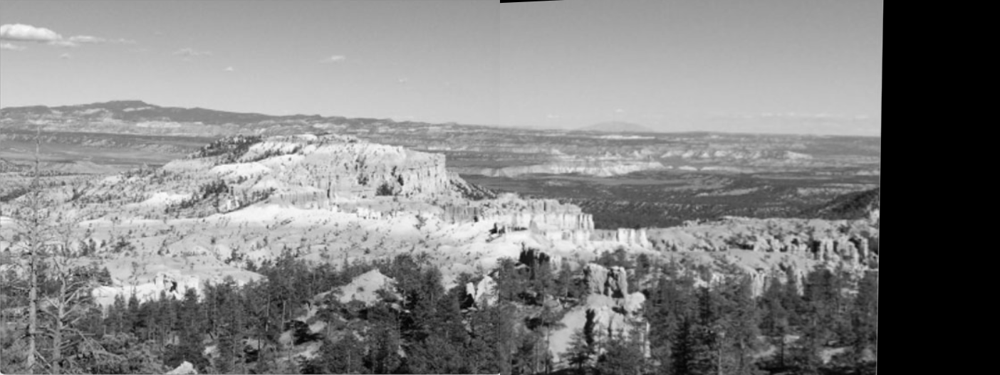

In [ ]:
cv2_imshow(stitched)

#### Trim for cylindrical

In [ ]:
def trim_cyl(img):
  return img[:, 260:1650]

In [ ]:
img_cyl1_crop = trim_cyl(img_cyl1)
img_cyl2_crop = trim_cyl(img_cyl2)
# img_cyl2_crop = img_cyl2.copy()
img_cyl3_crop = trim_cyl(img_cyl3)

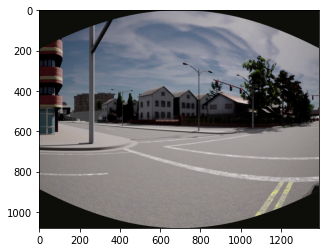

In [ ]:
plt.imshow(img_cyl1_crop)

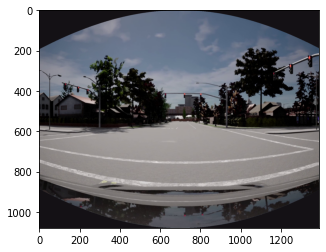

In [ ]:
plt.imshow(img_cyl2_crop)

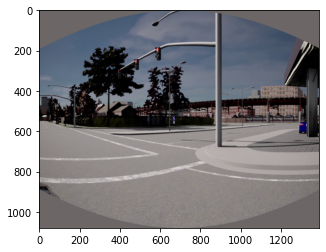

In [ ]:
plt.imshow(img_cyl3_crop)

#### Whole code (Function)

In [ ]:
def stitch(img_1, img_2):
  # img2 = cv2.imread('/content/Screenshot 2020-11-03 112809.png')
  # img3 = cv2.imread('/content/Screenshot 2020-11-03 112821.png')
  
  # img = cv2.cvtColor(img_1,cv2.COLOR_BGR2GRAY)
  # img = cv2.resize(img, (1024, 683))
  # imgm = cv2.cvtColor(img_2,cv2.COLOR_BGR2GRAY)
  # imgm = cv2.resize(imgm, (1024, 683))

  img = img_1.copy()
  imgm = img_2.copy()

  sift = cv2.xfeatures2d.SIFT_create()
  
  # Find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(imgm,None)
  kp2, des2 = sift.detectAndCompute(img,None)

  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des1,des2, k=2)

  # Apply ratio test
  good = []
  alpha = 0.5
  for m in matches:
      if m[0].distance < alpha*m[1].distance:
          good.append(m)
  matches = np.asarray(good)

  if len(matches[:,0]) >= 10:
      src = np.float32([ kp1[m.queryIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
      dst = np.float32([ kp2[m.trainIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
      H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
      
      '''
      Optional
      '''
      # Getting the dimensions of the image (To be used soon)
      # h, w = img.shape

      # pts = np.float32([ [0,0], [0, h-1], [w-1, h-1], [w-1,0 ] ]).reshape(-1,1,2)
      # img__ = cv2.perspectiveTransform(pts, H)

      '''
      To plot a line to display the stitch boundary
      '''
      # img_ = cv2.polylines(imgm, [np.int32(img__)], True, 255, 3, cv2.LINE_AA)
      
      '''
      To print the overlapping image
      '''
      # To reduce the file size
      # plt.imshow(imgm, cmap='gray')
      # cv2_imshow(img_)

  else:
      raise AssertionError("Cannot find enough keypoints.")

  # Homography Matrix
  print(H)

  stitched = cv2.warpPerspective(imgm, H, (img.shape[1] + imgm.shape[1], img.shape[0]))
  stitched[0:img.shape[0], 0:img.shape[1]] = img

  stitched = cv2.cvtColor(stitched, cv2.COLOR_GRAY2BGR)

  return stitched

**Trying the following:**
1. Left-Middle
2. Middle-Right
3. (1)+(2) - Whole 3 stitched together

[[ 7.06081407e-02 -3.44797362e-02  9.74743338e+02]
 [-2.63738395e-01  7.25184677e-01  1.46468183e+02]
 [-4.74709687e-04 -2.38069789e-05  1.00000000e+00]]


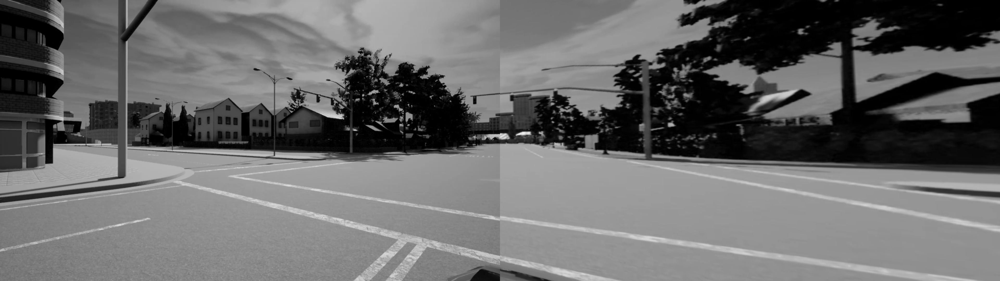

In [ ]:
# lm = stitch(img_cyl1_crop, img_cyl2_crop)
lm = stitch(img1, img2)
# lm = trim(lm)
cv2_imshow(lm)

[[ 6.18108676e-02 -3.81415003e-02  9.73981403e+02]
 [-2.69798135e-01  7.11403720e-01  1.55160876e+02]
 [-4.84005430e-04 -1.95012717e-05  1.00000000e+00]]


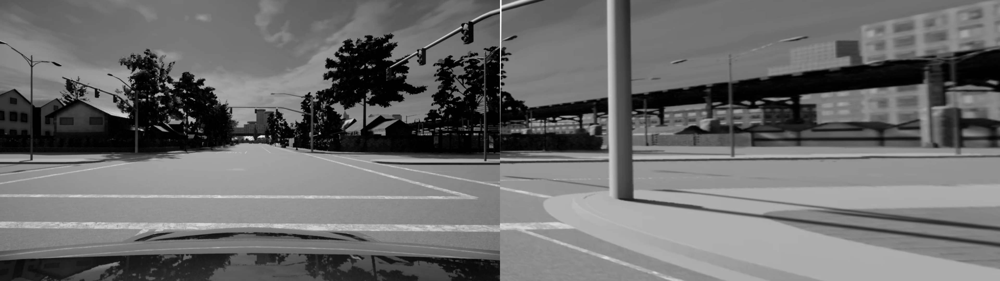

In [ ]:
# mr = stitch(img_cyl2_crop, img_cyl3_crop)
mr = stitch(img2, img3)
# mr = trim(mr)
cv2_imshow(mr)

[[ 5.18041297e-01  1.63501795e-01  6.76819756e+02]
 [-1.00547699e-01  9.01110424e-01  9.14475952e+01]
 [-1.88420227e-04  1.30941903e-04  1.00000000e+00]]


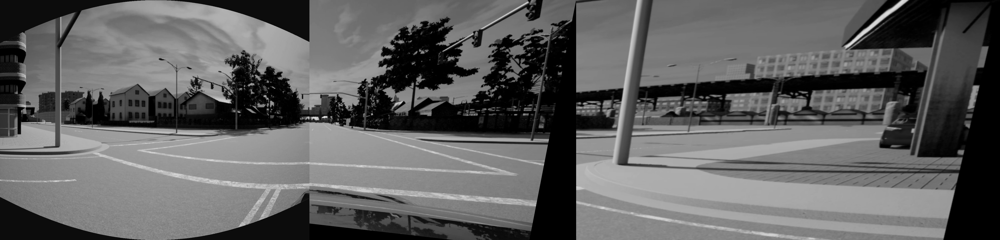

In [ ]:
final = stitch(lm, mr)
final = trim(final)
cv2_imshow(final)

**Library Used**

In [ ]:
# Stitching the images
images = [lm, mr]

(status, stitched) = stitcher.stitch(images)

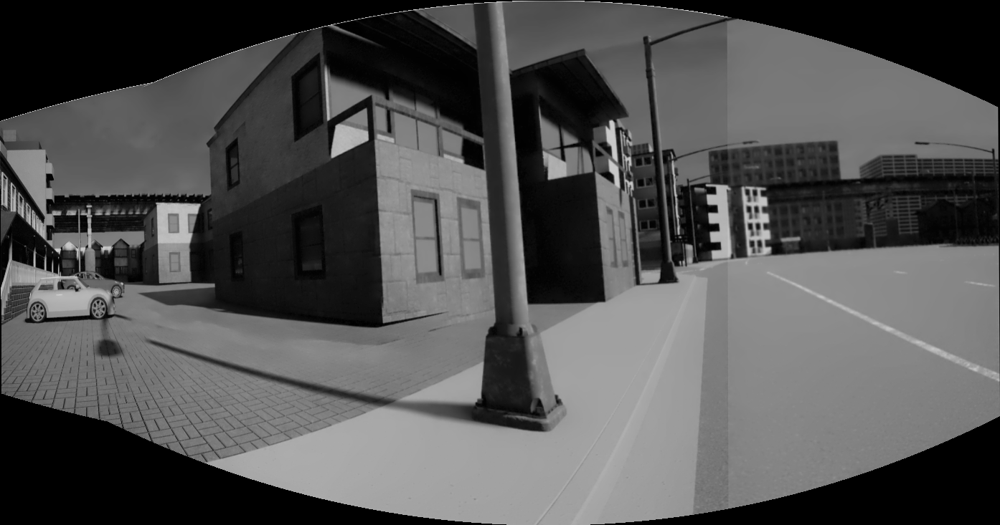

In [ ]:
cv2_imshow(stitched)

## Stitching Videos


In [ ]:
class VideoStitcher:
    def __init__(self, left_video_in_path, right_video_in_path, video_out_path, video_out_width=800, mmcount=10, display=False):
        # Initialize arguments
        self.left_video_in_path = left_video_in_path
        self.right_video_in_path = right_video_in_path
        self.video_out_path = video_out_path
        self.video_out_width = video_out_width
        self.display = display

        # Initialize the saved homography matrix
        self.saved_homo_matrix = None

        # Hyperparameters
        self.MIN_MATCH_COUNT = mmcount

    def stitch(self, images, ratio=0.55, reproj_thresh=3.0):
        # Unpack the images
        (image_b, image_a) = images

        # If the saved homography matrix is None, then we need to apply keypoint matching to construct it
        if self.saved_homo_matrix is None:
            # Detect keypoints and extract
            (keypoints_a, features_a) = self.detect_and_extract(image_a)
            (keypoints_b, features_b) = self.detect_and_extract(image_b)

            # Match features between the two images
            matched_keypoints = self.match_keypoints(self, keypoints_a, keypoints_b, features_a, features_b, ratio, reproj_thresh)

            # If the match is None, then there aren't enough matched keypoints to create a panorama
            if matched_keypoints is None:
                return None

            # Save the homography matrix
            self.saved_homo_matrix = matched_keypoints[1]

        # Apply a perspective transform to stitch the images together using the saved homography matrix
        output_shape = (image_a.shape[1] + image_b.shape[1], image_a.shape[0])
        result = cv2.warpPerspective(image_a, self.saved_homo_matrix, output_shape)
        result[0:image_b.shape[0], 0:image_b.shape[1]] = image_b

        # Return the stitched image
        return result

    @staticmethod
    def detect_and_extract(image):
        # Detect and extract features from the image (DoG keypoint detector and SIFT feature extractor)
        descriptor = cv2.xfeatures2d.SIFT_create()
        (keypoints, features) = descriptor.detectAndCompute(image, None)

        # Convert the keypoints from KeyPoint objects to numpy arrays
        keypoints = np.float32([keypoint.pt for keypoint in keypoints])

        # Return a tuple of keypoints and features
        return (keypoints, features)

    @staticmethod
    def match_keypoints(self, keypoints_a, keypoints_b, features_a, features_b, ratio, reproj_thresh):
        # Compute the raw matches and initialize the list of actual matches
        matcher = cv2.DescriptorMatcher_create("FlannBased")
        raw_matches = matcher.knnMatch(features_a, features_b, k=2)
        matches = []

        for raw_match in raw_matches:
            # Ensure the distance is within a certain ratio of each other (i.e. Lowe's ratio test)
            if len(raw_match) == 2 and raw_match[0].distance < raw_match[1].distance * ratio:
                matches.append((raw_match[0].trainIdx, raw_match[0].queryIdx))

        # Computing a homography requires at least 4 matches
        if len(matches) > self.MIN_MATCH_COUNT:
            # Construct the two sets of points
            points_a = np.float32([keypoints_a[i] for (_, i) in matches])
            points_b = np.float32([keypoints_b[i] for (i, _) in matches])

            # Compute the homography between the two sets of points
            (homography_matrix, status) = cv2.findHomography(points_a, points_b, cv2.RANSAC, reproj_thresh)

            # Return the matches, homography matrix and status of each matched point
            return (matches, homography_matrix, status)

        # No homography could be computed
        return None

    @staticmethod
    def draw_matches(image_a, image_b, keypoints_a, keypoints_b, matches, status):
        # Initialize the output visualization image
        (height_a, width_a) = image_a.shape[:2]
        (height_b, width_b) = image_b.shape[:2]
        visualisation = np.zeros((max(height_a, height_b), width_a + width_b, 3), dtype="uint8")
        visualisation[0:height_a, 0:width_a] = image_a
        visualisation[0:height_b, width_a:] = image_b

        for ((train_index, query_index), s) in zip(matches, status):
            # Only process the match if the keypoint was successfully matched
            if s == 1:
                # Draw the match
                point_a = (int(keypoints_a[query_index][0]), int(keypoints_a[query_index][1]))
                point_b = (int(keypoints_b[train_index][0]) + width_a, int(keypoints_b[train_index][1]))
                cv2.line(visualisation, point_a, point_b, (0, 255, 0), 1)

        # return the visualization
        return visualisation

    def run(self):
        # Set up video capture
        left_video = cv2.VideoCapture(self.left_video_in_path)
        right_video = cv2.VideoCapture(self.right_video_in_path)
        print('[INFO]: {} and {} loaded'.format(self.left_video_in_path.split('/')[-1],
                                                self.right_video_in_path.split('/')[-1]))
        print('[INFO]: Video stitching starting....')

        # Get information about the videos
        n_frames = min(int(left_video.get(cv2.CAP_PROP_FRAME_COUNT)),
                       int(right_video.get(cv2.CAP_PROP_FRAME_COUNT)))
        fps = int(left_video.get(cv2.CAP_PROP_FPS))
        frames = []

        for _ in tqdm.tqdm(np.arange(n_frames)):
            # Grab the frames from their respective video streams
            ok, left = left_video.read()
            _, right = right_video.read()

            if ok:
                # Stitch the frames together to form the panorama
                stitched_frame = self.stitch([left, right])
                

                # No homography could not be computed
                if stitched_frame is None:
                    print("[INFO]: Homography could not be computed!")
                    break

                # Add frame to video
                stitched_frame = imutils.resize(stitched_frame, width=self.video_out_width)
                frames.append(stitched_frame)

                if self.display:
                    # Show the output images
                    cv2.imshow("Result", stitched_frame)

                # If the 'q' key was pressed, break from the loop
                if cv2.waitKey(1) & 0xFF == ord("q"):
                    break

        cv2.destroyAllWindows()
        return frames

**Calling our Class**


In [ ]:
# Calling 'VideoStitcher'
stitcher = VideoStitcher(left_video_in_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Left.mp4',
                         right_video_in_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Front.mp4',
                         video_out_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/output1.mp4')

# The frames of the stitched images
frames = stitcher.run()

  0%|          | 0/14850 [00:00<?, ?it/s]

[INFO]: Left.mp4 and Front.mp4 loaded
[INFO]: Video stitching starting....


100%|██████████| 14850/14850 [23:40<00:00, 10.46it/s]


**Saving the video**

In [ ]:
print('[INFO]: Video stitching finished')

'''Writing via CV2'''
video_out_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/output1.mp4'
fps = 30

# Save video
# print('[INFO]: Saving {} in {}'.format(video_out_path.split('/')[-1], os.path.dirname(video_out_path)))

# size = (720, 1280)
# filename = 'Output1'
# out = cv2.VideoWriter(f'/content/drive/My Drive/Colab Notebooks/Carla Dataset/{filename}.avi', cv2.VideoWriter_fourcc(*'DIVX'), 30, size)
  
# for f in frames:
#   out.write(f)

# out.release()

'''Writing via Moviepy.editor'''
clip = ImageSequenceClip(frames, fps=fps)
clip.write_videofile(video_out_path, codec='mpeg4', audio=False, progress_bar=True, verbose=False)
print('[INFO]: {} saved'.format(video_out_path.split('/')[-1]))

  0%|          | 0/14851 [00:00<?, ?it/s]

[INFO]: Video stitching finished


100%|██████████| 14851/14851 [00:51<00:00, 286.09it/s]

[INFO]: output1.mp4 saved


#### Stitching the ground truth

In [ ]:
def stitch_gt(img_arr, stitcher):
  (status, stitched) = stitcher.stitch(img_arr)

  if (status==cv2.STITCHER_OK):
    # print('Panorama Generated')
    stitched = cv2.cvtColor(stitched, cv2.COLOR_BGR2RGB)
    
    return stitched

  else:
    # print('Error Generating Panorama')
    pass

In [ ]:
def run(left_video, mid_video, right_video, stitcher):
  
  # Get information about the videos
  n_frames = min( int(left_video.get(cv2.CAP_PROP_FRAME_COUNT)),
                  int(mid_video.get(cv2.CAP_PROP_FRAME_COUNT)),
                  int(right_video.get(cv2.CAP_PROP_FRAME_COUNT)) )
  
  fps = int(left_video.get(cv2.CAP_PROP_FPS))
  frames = []

  for _ in tqdm.tqdm(np.arange(n_frames)):
      # Grab the frames from their respective video streams
      ok, left = left_video.read()
      _, mid = mid_video.read()
      _, right = right_video.read()

      if ok:
          # Stitch the frames together to form the panorama
          stitched_frame = stitch_gt([left, mid, right], stitcher)
          
          # No homography could not be computed
          if stitched_frame is None:
              print("[INFO]: Homography could not be computed!")
              break

          # Add frame to video
          # stitched_frame = imutils.resize(stitched_frame, width=800)
          stitched_frame = cv2.resize(stitched_frame, (1024, 720))
          frames.append(stitched_frame)

          # If the 'q' key was pressed, break from the loop
          if cv2.waitKey(1) & 0xFF == ord("q"):
              break

  cv2.destroyAllWindows()
  return frames

In [ ]:
# Defining the stitcher
stitcher = cv2.createStitcher(try_use_gpu=True)

In [ ]:
# Defining the paths

left_video_in_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Left.mp4'
mid_video_in_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Front.mp4'
right_video_in_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/City/Right.mp4'

In [ ]:
# Set up video capture
left_video = cv2.VideoCapture(left_video_in_path)
mid_video = cv2.VideoCapture(mid_video_in_path)
right_video = cv2.VideoCapture(right_video_in_path)
print('[INFO]: {}, {} and {} loaded'.format(  left_video_in_path.split('/')[-1],
                                              mid_video_in_path.split('/')[-1],
                                              right_video_in_path.split('/')[-1])  )

print('[INFO]: Video stitching starting....')

# The frames of the stitched images
frames = run(left_video, mid_video, right_video, stitcher)




  0%|          | 0/14850 [00:00<?, ?it/s]

[INFO]: Left.mp4, Front.mp4 and Right.mp4 loaded
[INFO]: Video stitching starting....





  0%|          | 1/14850 [00:00<2:13:21,  1.86it/s]


  0%|          | 2/14850 [00:01<2:17:47,  1.80it/s]


  0%|          | 3/14850 [00:01<2:14:17,  1.84it/s]


  0%|          | 4/14850 [00:02<2:19:05,  1.78it/s]


  0%|          | 5/14850 [00:02<2:20:12,  1.76it/s]


  0%|          | 6/14850 [00:03<2:22:23,  1.74it/s]


  0%|          | 7/14850 [00:04<2:22:59,  1.73it/s]


  0%|          | 8/14850 [00:04<2:23:26,  1.72it/s]


  0%|          | 9/14850 [00:05<2:25:01,  1.71it/s]


  0%|          | 10/14850 [00:05<2:24:52,  1.71it/s]


  0%|          | 11/14850 [00:06<2:25:41,  1.70it/s]


  0%|          | 12/14850 [00:07<2:28:41,  1.66it/s]


  0%|          | 13/14850 [00:07<2:27:27,  1.68it/s]


  0%|          | 14/14850 [00:08<2:26:42,  1.69it/s]


  0%|          | 15/14850 [00:08<2:24:30,  1.71it/s]


  0%|          | 16/14850 [00:09<2:24:07,  1.72it/s]


  0%|          | 17/14850 [00:09<2:22:52,  1.73it/s]


  0%|          | 18/14850 [00:10<2:22:57,  1.73it/s]


  0%|          |

[INFO]: Homography could not be computed!


In [ ]:
print('[INFO]: Video stitching finished')

'''Writing via CV2'''
video_out_path='/content/drive/My Drive/Colab Notebooks/Carla Dataset/output2.mp4'
fps = 30

# Save video
# print('[INFO]: Saving {} in {}'.format(video_out_path.split('/')[-1], os.path.dirname(video_out_path)))

# size = (720, 1280)
# filename = 'Output1'
# out = cv2.VideoWriter(f'/content/drive/My Drive/Colab Notebooks/Carla Dataset/{filename}.avi', cv2.VideoWriter_fourcc(*'DIVX'), 30, size)
  
# for f in frames:
#   out.write(f)

# out.release()

'''Writing via Moviepy.editor'''
clip = ImageSequenceClip(frames, fps=fps)
clip.write_videofile(video_out_path, codec='mpeg4', audio=False, progress_bar=True, verbose=False)
print('[INFO]: {} saved'.format(video_out_path.split('/')[-1]))





  0%|          | 0/236 [00:00<?, ?it/s]



  4%|▍         | 10/236 [00:00<00:02, 97.35it/s]

[INFO]: Video stitching finished






 11%|█         | 25/236 [00:00<00:01, 107.98it/s]



 17%|█▋        | 41/236 [00:00<00:01, 118.24it/s]



 24%|██▎       | 56/236 [00:00<00:01, 124.62it/s]



 30%|██▉       | 70/236 [00:00<00:01, 128.73it/s]



 36%|███▌      | 85/236 [00:00<00:01, 134.08it/s]



 42%|████▏     | 100/236 [00:00<00:00, 137.25it/s]



 49%|████▊     | 115/236 [00:00<00:00, 138.62it/s]



 56%|█████▌    | 131/236 [00:00<00:00, 141.70it/s]



 62%|██████▏   | 146/236 [00:01<00:00, 142.97it/s]



 68%|██████▊   | 161/236 [00:01<00:00, 143.88it/s]



 75%|███████▍  | 176/236 [00:01<00:00, 142.65it/s]



 81%|████████  | 191/236 [00:01<00:00, 144.21it/s]



 87%|████████▋ | 206/236 [00:01<00:00, 142.74it/s]



 94%|█████████▎| 221/236 [00:01<00:00, 142.01it/s]



100%|██████████| 236/236 [00:01<00:00, 141.15it/s]

[INFO]: output2.mp4 saved
